# Caption Using VLM

## Motivation

Use VLM model (`SmolVLM2`) to generate captions given images.
There are three parts:
* Single Input Caption, i.e. each input has one image.
* Batch Input Caption, i.e. each input is a batch, with multiple images. Here batch_size=16.
* Batch Captioning on Multiple GPUs, i.e. each input is a batch and use multiGPU in parallel.

In [7]:
import torch
from torchvision import transforms as T
from torch.utils.data import DataLoader

from tqdm import tqdm
from helper import (
    get_VLM,
    caption,
    batch_caption,
)
from data import (
    get_data,
    get_dataloader,
    load_imagenet_labels,
)

from IPython.display import display

DEVICE = "cuda" if torch.cuda.is_available() else "mps" if torch.mps.is_available() else "cpu"
DTYPE = torch.bfloat16

In [3]:
ds = get_data()
in_labels = load_imagenet_labels()

processor, model = get_VLM(model="SmolVLM2")

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'ILSVRC/imagenet-1k' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.
Loading weights: 100%|███████████████████████| 657/657 [00:01<00:00, 477.94it/s]


In [4]:
prompt_template = """The image shows a {class_name}. 
Please come up with a short image caption, list and describe the main objects shown in the image. 
Keep the caption short, one sentence only."""
 

## Single Input Caption

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


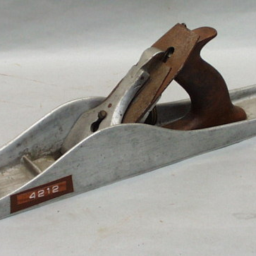

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


0 A hand plane with a rusty blade and a wooden handle is lying on a white surface.


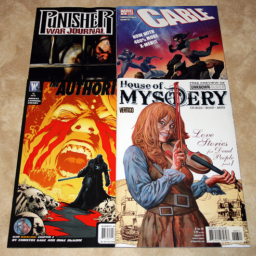

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


1 Four comic books with titles like "Punisher War Journal" and "House of Mystery" are displayed on a table.


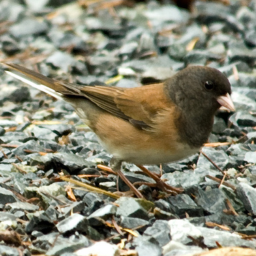

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


2 A junco bird with brown and gray feathers is walking on the ground.


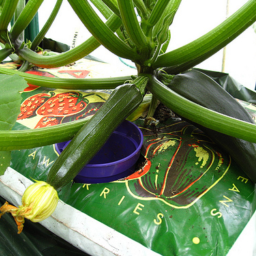

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


3 A green zucchini plant with purple pot and a yellow flower.


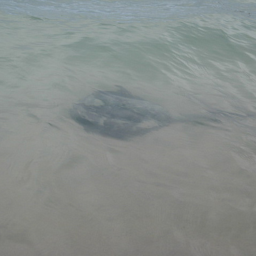

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


4 A stingray is swimming in shallow water near the shore.


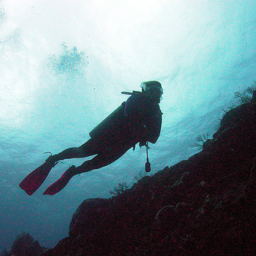

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


5 A scuba diver is swimming underwater with a flashlight in hand.


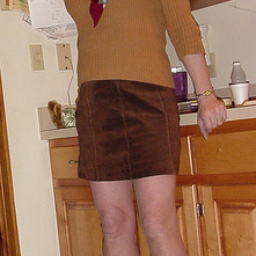

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


6 A woman wearing a brown skirt and a brown sweater is standing in a kitchen.


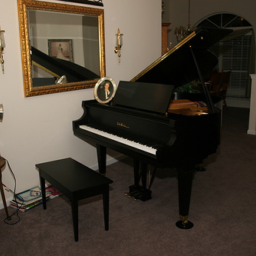

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


7 A black grand piano with a gold frame and a mirror above it.


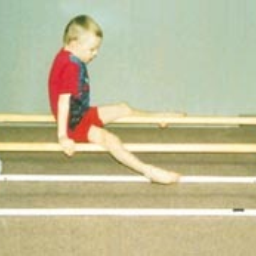

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


8 A young boy is doing a flip on parallel bars.


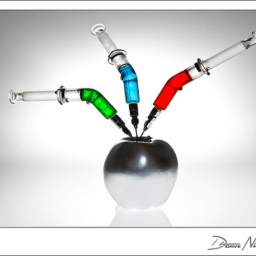

Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


9 A black apple with three syringes attached to it.


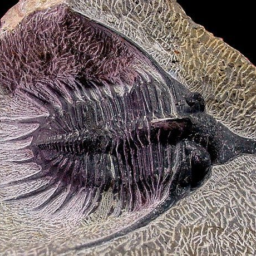

10 A trilobite fossil with a purple and black color scheme.


In [9]:
for i, d in enumerate(ds["train"]):
    # 1) Resize image to save VRAM
    # 2) Extract classname. d["label"] is a number (e.g. 23) -> convert to string ('vulture')
    image = T.CenterCrop(256)(T.Resize(256)(d["image"]))
    class_name = in_labels[d["label"]]

    prompt = prompt_template.format(class_name=class_name) # Insert class name into prompt
    res = caption(processor, model, image, prompt)
    display(image)
    print(i, res)
    if i == 10:
        break

## Batch Input Caption

0it [00:00, ?it/s]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


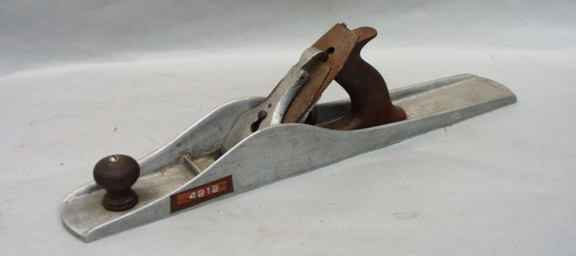

A vintage hand plane with a wooden handle and a metal blade, marked with the number 4212.
-----------------------


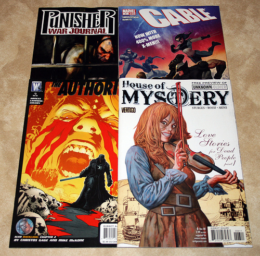

Four comic books with titles like "Punisher War Journal" and "House of Mystery" are laid out on a carpet.
-----------------------


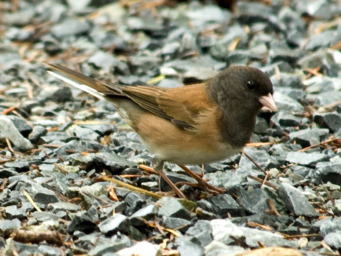

A junco bird with brown and white feathers is standing on a rocky ground.
-----------------------


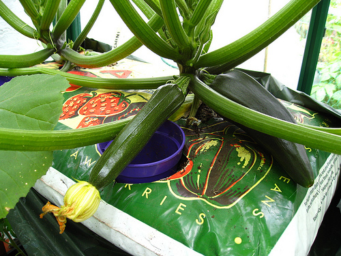

A zucchini plant with a purple pot and a yellow flower on top of a green bag.
-----------------------


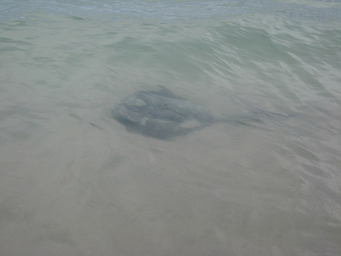

A stingray is swimming in shallow water.
-----------------------


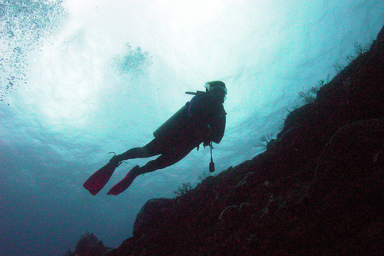

A scuba diver is swimming over a coral reef.
-----------------------


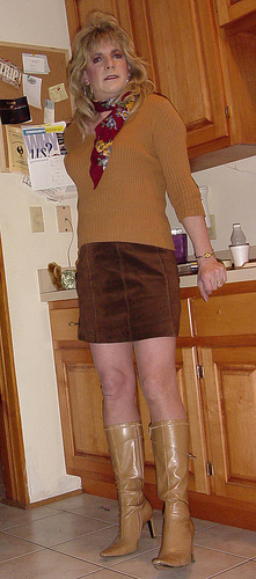

A woman wearing a brown sweater, brown skirt, and tan boots stands in a kitchen.
-----------------------


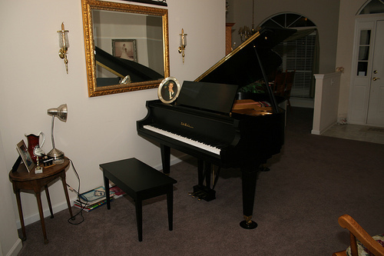

A black grand piano with a gold frame and a small bench in a room with a carpeted floor.
-----------------------


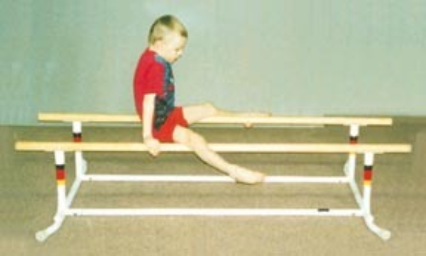

A young boy in a red shirt and shorts is performing a gymnastics routine on parallel bars.
-----------------------


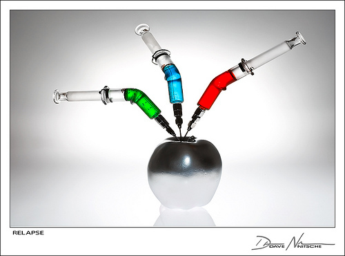

A black apple with three syringes in it, one blue, one red and one green.
-----------------------


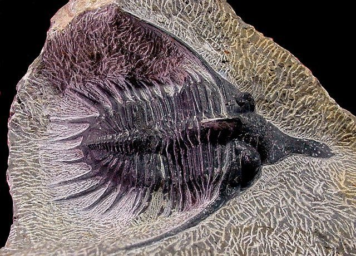

A trilobite fossil with a purple and black color scheme.
-----------------------


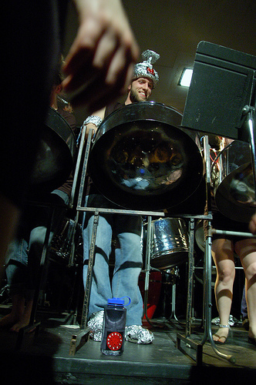

A man wearing a silver hat is playing a steel drum.
-----------------------


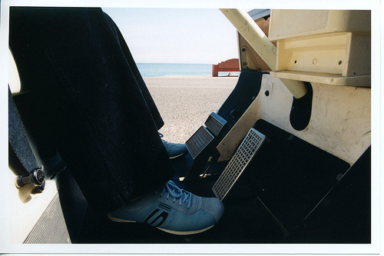

A person's feet are on the pedals of a golf cart.
-----------------------


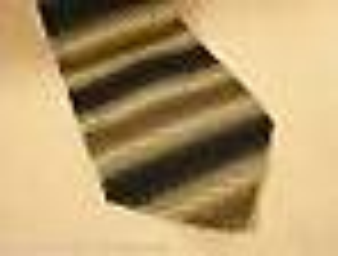

A Windsor tie with a pattern of stripes in shades of green and gold.
-----------------------


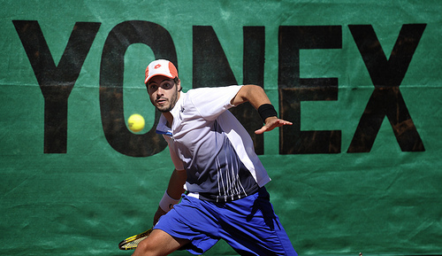

A man in a white shirt and blue shorts is playing tennis on a green court with a yellow ball.
-----------------------


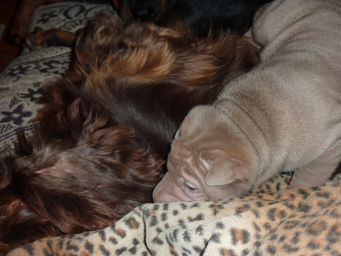

A brown and black Cocker Spaniel dog is sleeping on a leopard print blanket.
-----------------------


0it [00:13, ?it/s]


In [13]:
batch_size= 16

dataloader = get_dataloader(ds, in_labels, batch_size=batch_size)

for images, class_names in tqdm(dataloader):
    # Assemble prompts by inserting the actual class name into the template
    prompts = [
        prompt_template.format(class_name=class_names[i])
        for i in range(len(images))
    ]
    
    # Prompt model with entire batch of images
    captions = batch_caption(processor, model, images, prompts)
    # print(i, captions)

    for img, cap in zip(images, captions):
        display(img)
        print(cap)
        print('-----------------------')

    break

##  Batch Captioning on Multiple GPUs

In [20]:
from torch.utils.data.distributed import DistributedSampler
import torch.distributed as dist
from datasets import Dataset

In [31]:
if not dist.is_initialized():
    dist.init_process_group(backend='nccl')

seed = 42
torch.manual_seed(seed)

world_size = dist.get_world_size()
rank = dist.get_rank()
is_master = rank == 0  
torch.cuda.set_device(rank)

num_samples = 200

batch_size = 16

`trust_remote_code` is not supported anymore.
Please check that the Hugging Face dataset 'ILSVRC/imagenet-1k' isn't based on a loading script and remove `trust_remote_code`.
If the dataset is based on a loading script, please ask the dataset author to remove it and convert it to a standard format like Parquet.


Hello from rank 0


GPU0:   0%|                                              | 0/38 [00:00<?, ?it/s]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


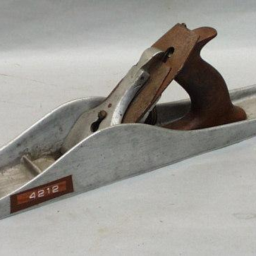

A rusty old hand plane with a wooden handle and a metal blade.
-----------------------


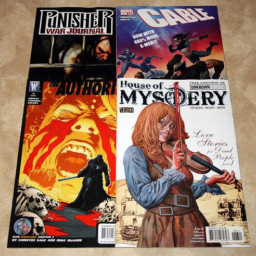

Four comic books with titles like "Punisher War Journal" and "House of Mysdery" are laid out on a carpet.
-----------------------


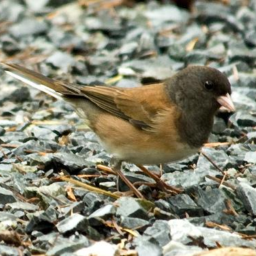

A junco bird with brown and white feathers is walking on the ground.
-----------------------


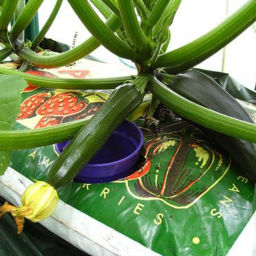

A green zucchini plant with purple plastic pot and a green bag with a picture of a strawberry on it.
-----------------------


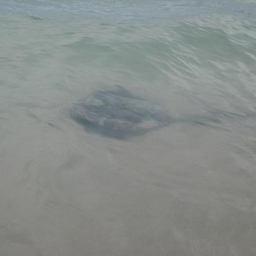

A stingray is swimming in the ocean.
-----------------------


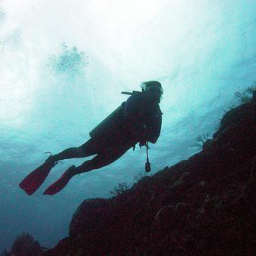

A scuba diver is swimming over a coral reef.
-----------------------


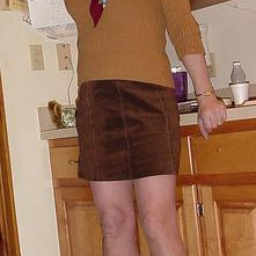

A woman wearing a brown skirt and a brown sweater is standing in a kitchen.
-----------------------


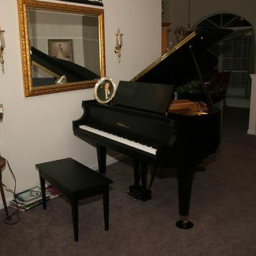

GPU0:   3%|█                                     | 1/38 [00:06<03:47,  6.15s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A black grand piano with a gold frame and a mirror above it.
-----------------------


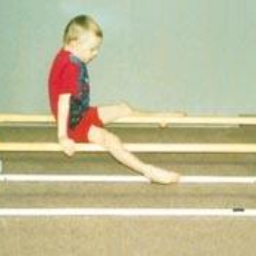

A young boy is sitting on parallel bars.
-----------------------


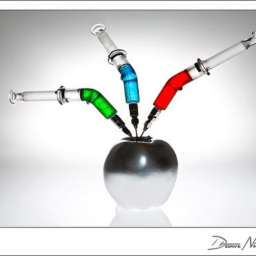

A black apple with three syringes attached to it.
-----------------------


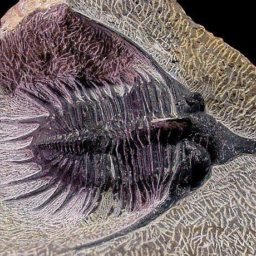

A trilobite fossil with a purple and black color scheme.
-----------------------


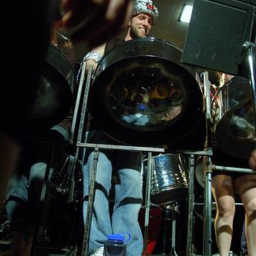

A man wearing a hat is playing a steel drum.
-----------------------


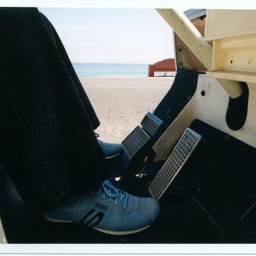

A person wearing blue sneakers is sitting in a golf cart with their feet on the pedals.
-----------------------


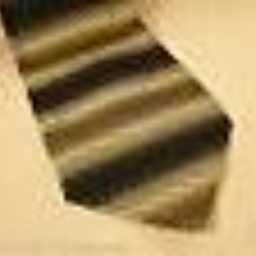

A Windsor tie with a pattern of stripes in shades of brown and black.
-----------------------


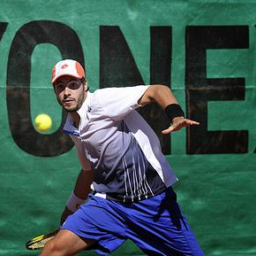

A man in a white shirt and blue shorts is playing tennis on a green court.
-----------------------


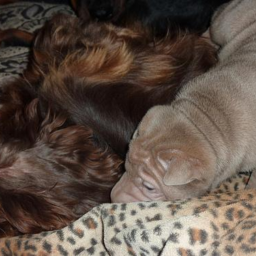

GPU0:   5%|██                                    | 2/38 [00:10<03:10,  5.30s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A brown and black Cocker Spaniel dog is sleeping on a leopard print blanket.
-----------------------


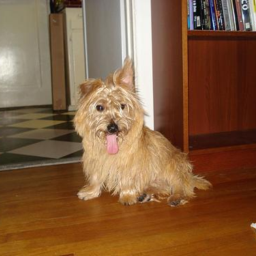

A Cairn Terrier sitting on a wooden floor with its tongue out.
-----------------------


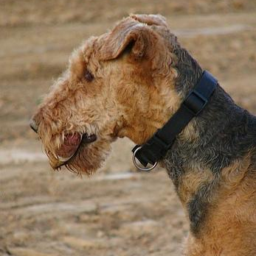

A brown and black Airedale Terrier dog wearing a black collar.
-----------------------


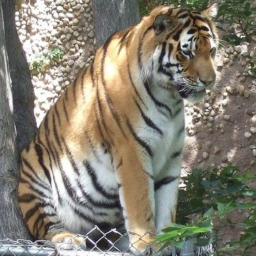

A tiger sits on a fence in a zoo enclosure.
-----------------------


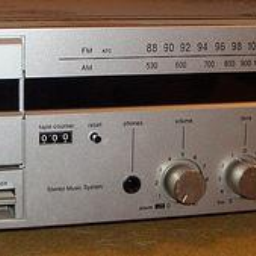

A tape player with knobs and a display screen.
-----------------------


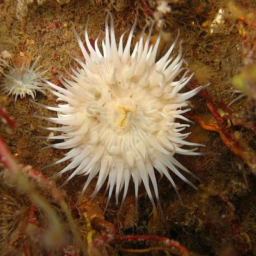

A white sea anemone with long white tentacles on a brown seabed.
-----------------------


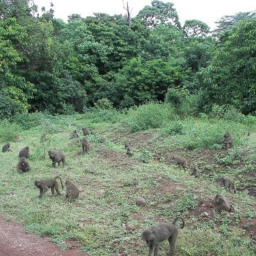

A group of baboons are walking in a field.
-----------------------


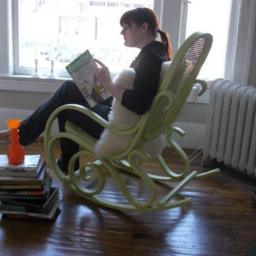

A woman is sitting in a green rocking chair and reading a book.
-----------------------


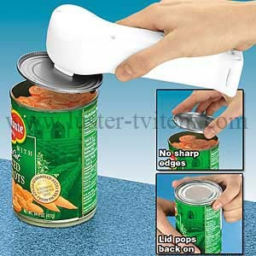

GPU0:   8%|███                                   | 3/38 [00:15<02:53,  4.96s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A white can opener is being used to open a can of food.
-----------------------


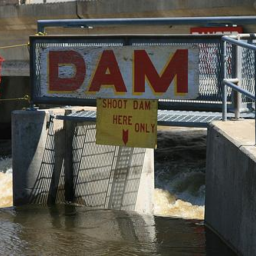

A sign on a dam reads "Shoot Dam Here Only".
-----------------------


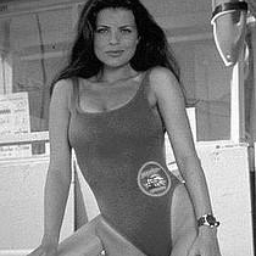

A woman in a tank suit with a logo on it.
-----------------------


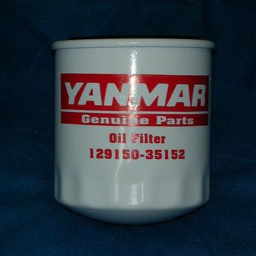

A white oil filter with red and white text and a phone number on it.
-----------------------


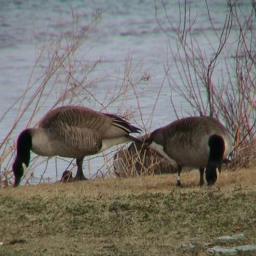

Two geese are standing in a field near a body of water.
-----------------------


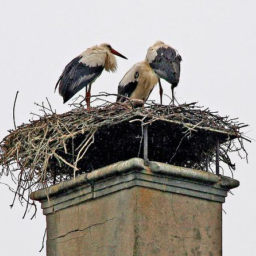

Three white storks standing on a nest atop a chimney.
-----------------------


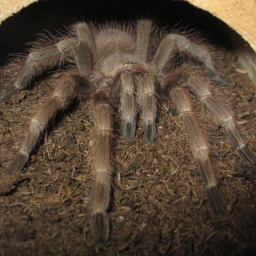

A tarantula is resting on a substrate.
-----------------------


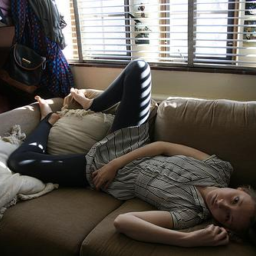

A woman is lying on a couch with her legs up in the air.
-----------------------


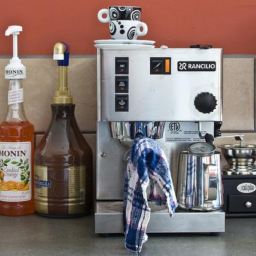

GPU0:  11%|████                                  | 4/38 [00:19<02:43,  4.81s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A coffee machine with a blue and white cloth hanging on it.
-----------------------


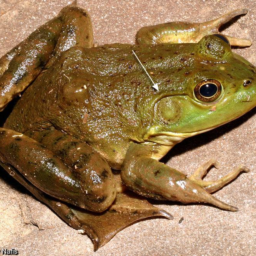

A close-up of an American bullfrog with a white arrow pointing to its eye.
-----------------------


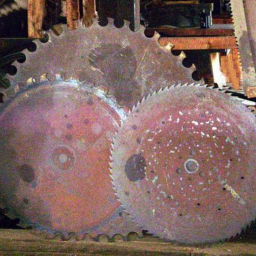

A sawmill with two large saw blades in the foreground.
-----------------------


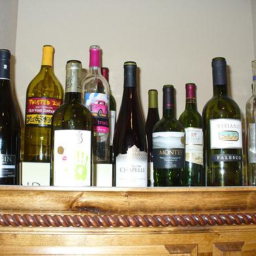

A collection of wine bottles on a shelf with a wooden handle.
-----------------------


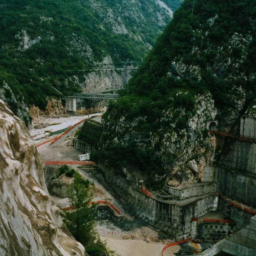

A valley with a river running through it and a bridge over the river.
-----------------------


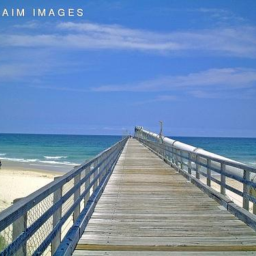

A wooden pier extending into the ocean with a clear blue sky above.
-----------------------


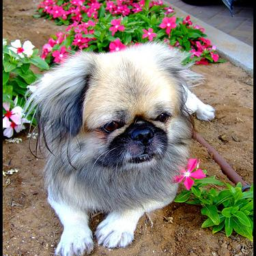

A small dog with a long coat is standing in front of a garden bed with pink flowers.
-----------------------


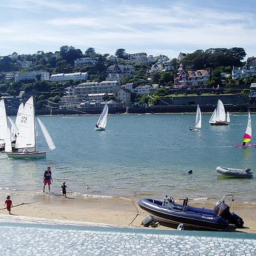

A group of people are on a beach with sailboats and a small boat.
-----------------------


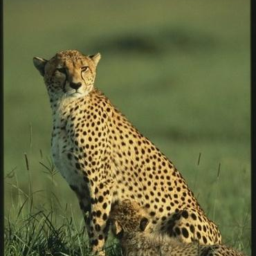

GPU0:  13%|█████                                 | 5/38 [00:24<02:37,  4.77s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A cheetah is sitting in a grassy field.
-----------------------


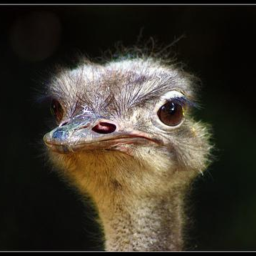

A close-up of an ostrich's head with its eyes and beak visible.
-----------------------


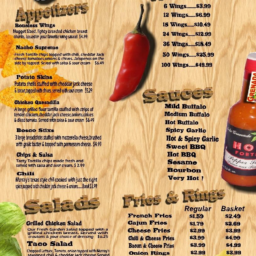

A menu with a wood background and a bottle of hot sauce.
-----------------------


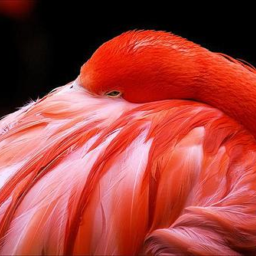

A flamingo with its head tucked under its wing.
-----------------------


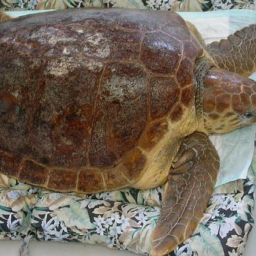

A large brown and tan sea turtle is resting on a white cloth.
-----------------------


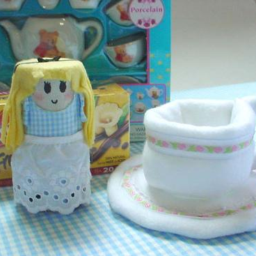

A doll with blonde hair and a blue dress is sitting on a table with a cup and saucer.
-----------------------


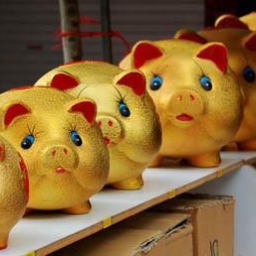

A row of gold piggy banks with blue eyes and red ears are lined up on a white surface.
-----------------------


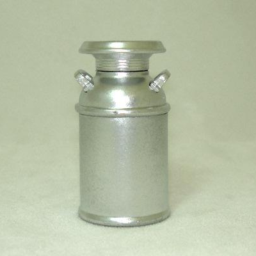

A small silver milk can with two handles on top.
-----------------------


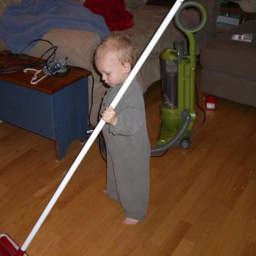

GPU0:  16%|██████                                | 6/38 [00:29<02:32,  4.77s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A baby in a grey onesie is holding a white mop.
-----------------------


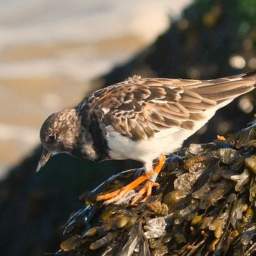

A ruddy turnstone is standing on a rock with its beak open.
-----------------------


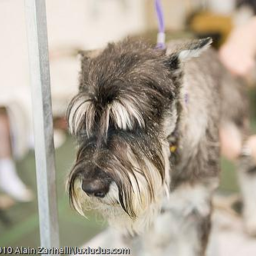

A Standard Schnauzer dog with a purple leash is standing in a room.
-----------------------


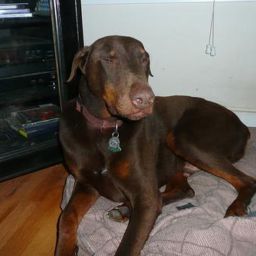

A brown Doberman dog is lying on a bed with a collar and tag.
-----------------------


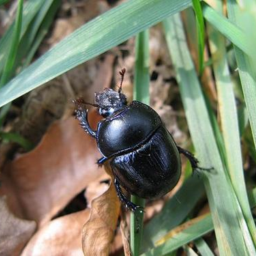

A black beetle with a shiny exoskeleton is standing on a green leaf.
-----------------------


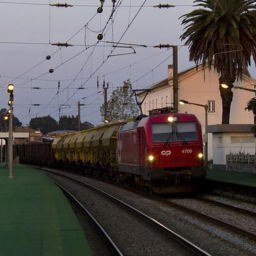

A red electric locomotive with yellow cars on the tracks.
-----------------------


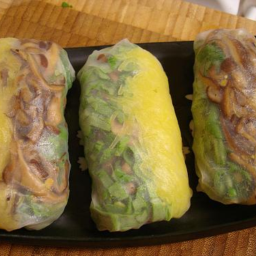

Three spring rolls on a black plate with a wooden table in the background.
-----------------------


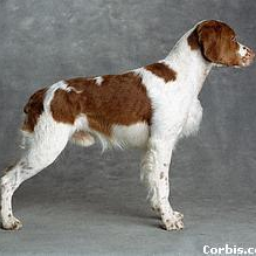

Brittany Spaniel standing on a grey background.
-----------------------


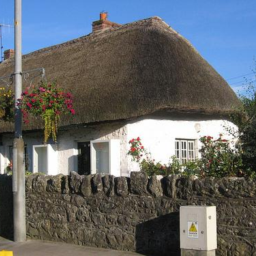

GPU0:  18%|███████                               | 7/38 [00:34<02:26,  4.72s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A thatched roof house with a stone wall and a yellow sign.
-----------------------


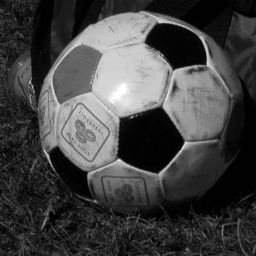

A black and white soccer ball with a sticker on it is laying on the grass.
-----------------------


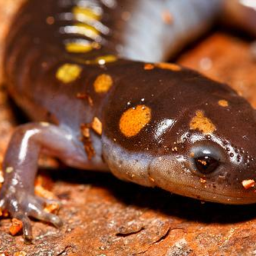

A spotted salamander with orange spots on its back and grey on its belly is on a rock.
-----------------------


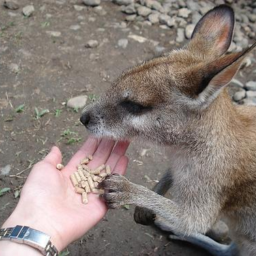

A wallaby is eating from a person's hand.
-----------------------


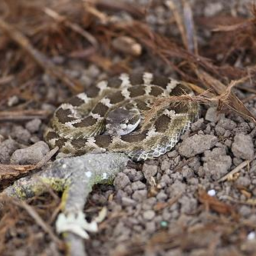

A rattlesnake is resting on the ground with a dead bird in its mouth.
-----------------------


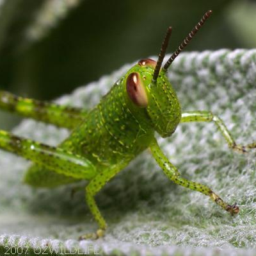

A green grasshopper with brown eyes and antennae is on a green leaf.
-----------------------


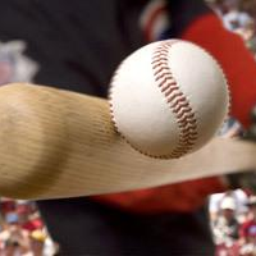

A baseball is held by a wooden bat.
-----------------------


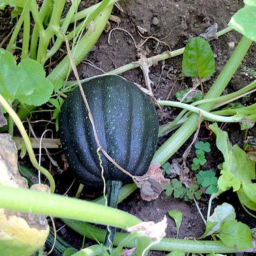

A green acorn squash is nestled in the dirt surrounded by green leaves.
-----------------------


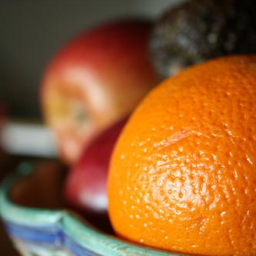

GPU0:  21%|████████                              | 8/38 [00:38<02:21,  4.72s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A close up of a bowl of fruit including an orange.
-----------------------


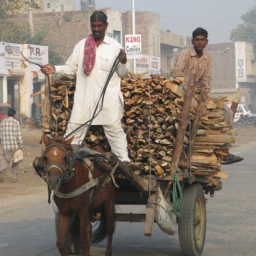

A man rides a horse pulling a cart full of wood.
-----------------------


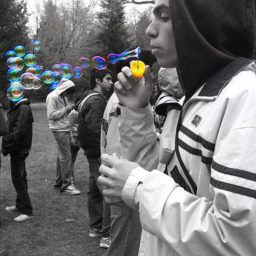

A man blowing bubbles in a park with a group of people in the background.
-----------------------


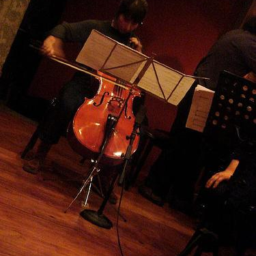

A cello is on a stand with a person playing it.
-----------------------


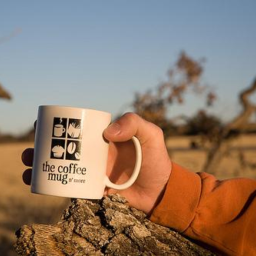

A person is holding a white coffee mug with the words "the coffee mug" on it.
-----------------------


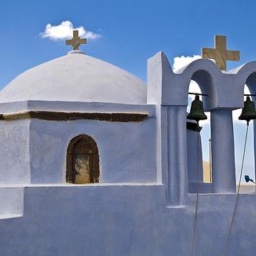

A white church with a dome and crosses on top.
-----------------------


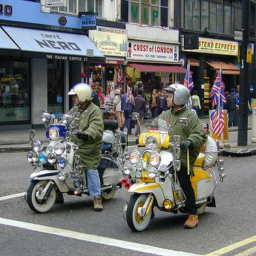

Two motorcyclists are riding on a street with a crowd of people in the background.
-----------------------


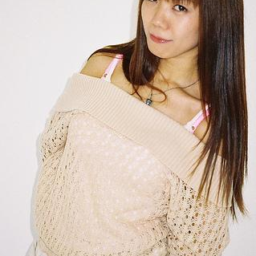

A woman wearing a beige sweater and a pink bra.
-----------------------


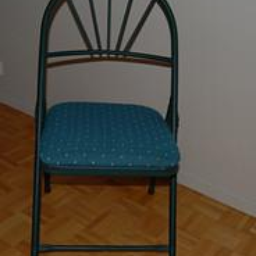

GPU0:  24%|█████████                             | 9/38 [00:43<02:17,  4.73s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A blue folding chair with a blue cushion is sitting on a wooden floor.
-----------------------


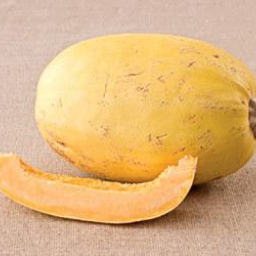

A yellow spaghetti squash on a beige surface with a peel on the side.
-----------------------


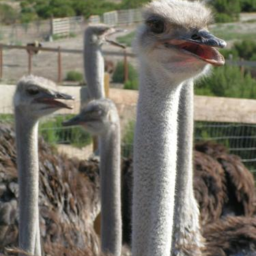

Three ostriches with their beaks open are standing in a fenced area.
-----------------------


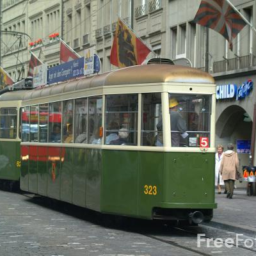

A green and yellow tram with the number 323 on the front is driving down a street.
-----------------------


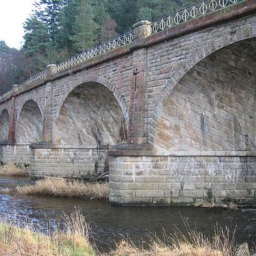

A stone viaduct with arches over a river.
-----------------------


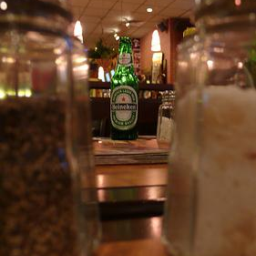

A green Heineken beer bottle is in the middle of a table with salt shakers on either side.
-----------------------


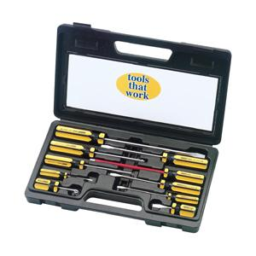

A screwdriver set with a yellow and black case.
-----------------------


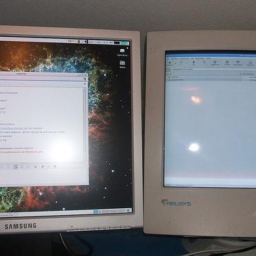

Two CRT monitors on a desk with a galaxy wallpaper on the left one.
-----------------------


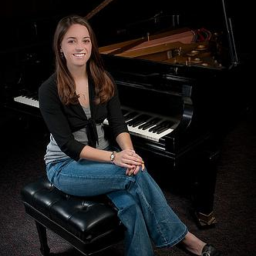

GPU0:  26%|█████████▋                           | 10/38 [00:48<02:12,  4.75s/it]Kwargs passed to `processor.__call__` have to be in `processor_kwargs` dict, not in `**kwargs`


A young woman is sitting on a bench in front of a grand piano.
-----------------------


GPU0:  26%|█████████▋                           | 10/38 [01:07<03:09,  6.77s/it]


KeyboardInterrupt: 

In [33]:
 ## Prepare dataloader
def collate_fn(items):
    return [
        [T.CenterCrop(256)(T.Resize(256)(i["image"])) for i in items],
        [in_labels[i["label"]] for i in items],
    ]


def process(rank, is_master, world_size, batch_size=8):
    print(f"Hello from rank {rank}")

    ds = get_data()
    ds = ds["train"].take(num_samples + 100)
    ds = Dataset.from_list(list(ds), features=ds.features)

    sampler = DistributedSampler(ds, shuffle=False)

    dataloader = DataLoader(
        ds,
        sampler=sampler,
        collate_fn=collate_fn,
        batch_size=batch_size,
        num_workers=8,    # Use 8 threads for prefetching
        prefetch_factor=10  # Each thread will prefetch 10 samples
    )

    i = 0
    for images, class_names in tqdm(dataloader, f"GPU{rank}"):
        # Assemble prompts by inserting the actual class name into the template
        prompts = [
            prompt_template.format(class_name=class_names[i])
            for i in range(len(images))
        ]

        # Prompt model with entire batch of images
        captions = batch_caption(processor, model, images, prompts)
        # print(i, captions)

        for img, cap in zip(images, captions):
            display(img)
            print(cap)
            print('-----------------------')

        i += 1
        if i == 4: 
            break


process(rank, is_master, world_size)
dist.destroy_process_group()